# Caso de Negocio

El Internet de las Cosas (IoT) está desempeñando un papel fundamental en nuestras vidas, conectando objetos a servicios digitales y transformando cómo interactuamos en lo laboral, productivo y personal. Las aplicaciones del IoT son variadas: desde la automatización del hogar, convirtiendo nuestras casas en espacios inteligentes, hasta las ciudades inteligentes que utilizan sensores para abordar problemas como la delincuencia y el tráfico. En la agricultura, la monitorización de cultivos a través de sensores optimiza la producción, mientras que en el sector retail, la tecnología bluetooth proporciona información de localización y ofertas a los clientes dentro de las tiendas. 

Sin embargo, el IoT enfrenta desafíos, como los ataques de botnets, que explotan vulnerabilidades en los protocolos de aplicación y pueden causar fugas de datos y violaciones de seguridad. Los sistemas de detección de intrusos son una solución crucial, capaces de identificar eventos maliciosos y rastrear actividades sospechosas en las redes IoT. 

Este proyecto tiene como objetivo desarrollar un sistema de detección de intrusos utilizando técnicas de machine learning para identificar ataques de botnets y sus características distintivas. Se utilizará un conjunto de datos que incluye paquetes de red describiendo actividades normales y nueve tipos de ataques diferentes. Un aspecto clave será caracterizar estas amenazas de manera efectiva para una detección temprana y precisa.

# Instrucciones

Tomando en cuenta el problema planteado y así como los datos que se han
suministrado para llevar adelante este proyecto (en anexo, con el diccionario proporcionado por la fuente de los datos):

1) Explique cómo llevaría adelante este proyecto de análisis de datos para alcanzar los objetivos planteados, indicando las tareas de aprendizaje que se propone realizar para obtener el conocimiento que permita la construcción del sistema de seguridad.

2) A partir de las tareas analíticas que ha planteado para este proyecto, proponga un esquema de limpieza y preparación de datos.

# 0. Cargas iniciales

### 0.1. Importación de librerías

In [2]:
#Manejo de datos
import pandas as pd
import numpy as np

#Visualización de datos
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#Analisis profundo de datos
from ydata_profiling import ProfileReport

#Entrenamiento del modelo
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, FunctionTransformer
from sklearn.linear_model import Lasso, Ridge
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.compose import ColumnTransformer, make_column_selector

#Persistencia de modelos
from joblib import dump, load

#Librerías extras
import itertools

print(f"La versión de sklearn es: {sklearn.__version__}")

La versión de sklearn es: 1.4.1.post1


### 0.2. Carga de datos

In [3]:
url = './Data/DatosExamen.csv'

data = pd.read_csv(url, sep=';')

data.head()



,id,service,sbytes,dbytes,sttl,dttl,sloss,dloss,swin,stcpb,...,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,25647,ftp-data,424,8824,31,29,1,4,255,2604752930,...,0,5,1,1,5,8,3,0,Normal,0
1,20589,-,2958,32746,31,29,7,18,255,3776349725,...,0,4,1,1,5,8,7,0,Normal,0
2,15863,-,7814,16912,31,29,30,32,255,3699167179,...,0,3,1,1,2,4,2,0,Normal,0
3,8495,-,3806,51808,31,29,7,26,255,532786446,...,0,1,1,1,1,6,4,0,Normal,0
4,10023,http,1052,824,31,29,2,2,255,2352172386,...,0,3,3,1,10,18,1,0,Normal,0


In [4]:
train, test = train_test_split(data, test_size=0.2, random_state=19)
train.head()

,id,service,sbytes,dbytes,sttl,dttl,sloss,dloss,swin,stcpb,...,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
3371,38275,smtp,37808,3380,31,29,19,8,255,2684207714,...,0,4,1,1,1,2,1,0,Normal,0
18441,128252,dns,114,0,254,0,0,0,0,0,...,2,19,18,18,25,18,25,0,Generic,1
43154,95928,http,828,1372,62,252,2,2,255,887756255,...,1,1,3,1,1,3,1,0,Exploits,1
8295,14648,-,3806,54798,31,29,7,26,255,602430033,...,0,2,1,1,4,7,8,0,Normal,0
51813,86522,http,19056,3618028,62,252,2,1312,255,614677404,...,1,1,1,1,1,3,1,0,Exploits,1


# 1. Preprocesamiento de los datos

## 1.1. Exploración de los datos

In [5]:
ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

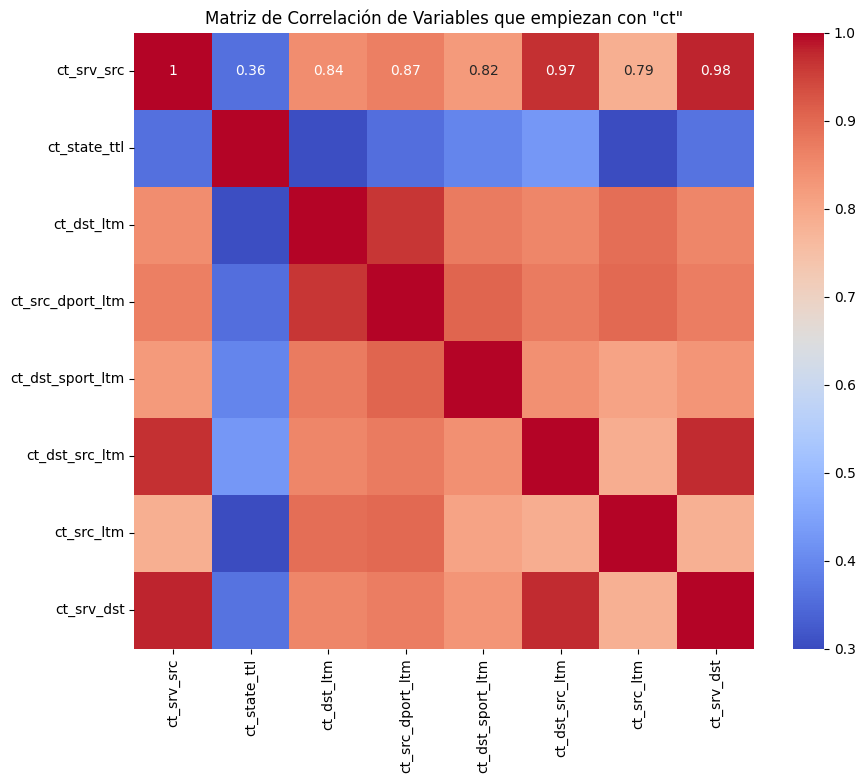

Tabla de promedios de correlación ordenados de mayor a menor:
                  Promedio de correlación
ct_src_dport_ltm                 0.842229
ct_dst_src_ltm                   0.840649
ct_srv_dst                       0.832278
ct_srv_src                       0.828713
ct_dst_ltm                       0.823599
ct_dst_sport_ltm                 0.809694
ct_src_ltm                       0.782182
ct_state_ttl                     0.438398


In [6]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Evaluar correlación entre variables numéricas que empiezan con "ct"
ct_columns = train.filter(regex='^ct', axis=1).columns

# Matriz de correlación
corr = train[ct_columns].corr()

# Visualización de la matriz de correlación
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Matriz de Correlación de Variables que empiezan con "ct"')
plt.show()

# Calcular el promedio de correlaciones de cada variable con las otras variables
mean_corr = corr.mean(axis=1)

# Ordenar los promedios de correlación de mayor a menor
mean_corr_sorted = mean_corr.sort_values(ascending=False)

# Crear un DataFrame con los promedios de correlación ordenados
df_mean_corr_sorted = pd.DataFrame(mean_corr_sorted, columns=['Promedio de correlación'])

# Mostrar la tabla ordenada
print("Tabla de promedios de correlación ordenados de mayor a menor:")
print(df_mean_corr_sorted)



In [16]:
#See values of the column sbytes
train['sbytes'].value_counts()

#Plot value counts of the column sbytes
# train['sbytes'].value_counts().plot(kind='bar', figsize=(10, 6))

train['sbytes'].value_counts().sort_values(ascending=False).head(10)



sbytes
114     9489
200     5636
146     1232
564      857
168      849
46       634
104      578
534      553
1540     537
568      474
Name: count, dtype: int64